# Week 3: Multiview Reconstruction

# Week 2: Stereo Estimation

If you are working in Colab,
*   Open Files from left
*   Drag and drop `Week3_MVS.zip` there (or click upload icon on top left). Upload can take a few minutes.
*   Unzip the file by running the following cell.


In [ ]:
!unzip Week3_MVS.zip
%cd Week3_MVS

Archive:  Week3_MVS.zip
   creating: Week3_MVS/
  inflating: Week3_MVS/.DS_Store     
   creating: __MACOSX/
   creating: __MACOSX/Week3_MVS/
  inflating: __MACOSX/Week3_MVS/._.DS_Store  
  inflating: Week3_MVS/Week3_MVS.ipynb  
  inflating: __MACOSX/Week3_MVS/._Week3_MVS.ipynb  
   creating: Week3_MVS/.ipynb_checkpoints/
  inflating: Week3_MVS/.ipynb_checkpoints/Week2_Stereo-checkpoint.ipynb  
  inflating: Week3_MVS/.ipynb_checkpoints/Week3_MVS-checkpoint.ipynb  
   creating: Week3_MVS/data/
  inflating: Week3_MVS/data/.DS_Store  
   creating: __MACOSX/Week3_MVS/data/
  inflating: __MACOSX/Week3_MVS/data/._.DS_Store  
   creating: Week3_MVS/data/KITTI-Raw/
  inflating: Week3_MVS/data/KITTI-Raw/.DS_Store  
   creating: __MACOSX/Week3_MVS/data/KITTI-Raw/
  inflating: __MACOSX/Week3_MVS/data/KITTI-Raw/._.DS_Store  
   creating: Week3_MVS/data/KITTI-Raw/2011_09_26/
  inflating: Week3_MVS/data/KITTI-Raw/2011_09_26/calib_velo_to_cam.txt  
  inflating: Week3_MVS/data/KITTI-Raw/2011_09_26/.DS

*   If you get disconnected from the runtime, you might need to upload this file again. Also, note that this is valid for other local files too eg. repos that have been cloned, files generated during execution etc. In short, if you see that your files are gone after a while, just run the cell that generates, clones, etc. the missing files again.

## Part A: More on Projections

### Question 1: Transformations

Derive the matrices $M \in SE(3) \subset \mathbb{R}^{4 \times 4}$ representing the following transformations:

* Translation by the vector $T \in \mathbb{R}^3$
* Rotation by the rotation matrix $R \in \mathbb{R}^{3 \times 3}$
* Rotation by $R$ followed by the translation $T$
* Translation by $T$ followed by the rotation $R$

**Hint:** Remember that we can write the transformation matrix $M$ for a given rotation matrix
$R = \begin{bmatrix}
r_{11} & r_{12} & r_{13} \\
r_{21} & r_{22} & r_{23} \\
r_{31} & r_{32} & r_{33}
\end{bmatrix}$ and a translation vector $T = \begin{bmatrix}
t_x \\
t_y \\
t_z
\end{bmatrix}$ as follows:
$M = 
\begin{pmatrix}
R & T \\
0 & 1
\end{pmatrix}
=
\begin{bmatrix}
r_{11} & r_{12} & r_{13} & t_x \\
r_{21} & r_{22} & r_{23} & t_y \\
r_{31} & r_{32} & r_{33} & t_z \\
0 & 0 & 0 & 1 \\
\end{bmatrix}$

**Answer**: 
* Translation:
$$
M=\left[\begin{array}{llll}
1 & 0 & 0 & t_{x} \\
0 & 1 & 0 & t_{y} \\
0 & 0 & 1 & t_{z} \\
0 & 0 & 0 & 1
\end{array}\right]
$$

* Rotation by R:
$$
M=\left[\begin{array}{cccc}
r_{11} & r_{12} & r_{13} & 0 \\
r_{21} & r_{22} & r_{23} & 0 \\
r_{31} & r_{32} & r_{33} & 0 \\
0 & 0 & 0 & 1
\end{array}\right]
$$

* Rotation by R followed by translation by T. Due to associativity property of Euclidian transforms, order is not important:
$$
M=\left[\begin{array}{cccc}
r_{11} & r_{12} & r_{13} & t_{x} \\
r_{21} & r_{22} & r_{23} & t_{y} \\
r_{31} & r_{32} & r_{33} & t_{z} \\
0 & 0 & 0 & 1
\end{array}\right]
$$

* Translation by T followed by rotation by R. Due to associativity property of Euclidian transforms, order is not important:
$$
M=\left[\begin{array}{cccc}
r_{11} & r_{12} & r_{13} & t_{x} \\
r_{21} & r_{22} & r_{23} & t_{y} \\
r_{31} & r_{32} & r_{33} & t_{z} \\
0 & 0 & 0 & 1
\end{array}\right]
$$

### Question 2: Scale Ambiguity

A classic ambiguity of the perspective projection is that one cannot tell an object from another object that is exactly twice as big but twice as far. Explain why this is true.

**Hint:** Let $P = (X, Y, Z)$ be a point on the smaller object and $P' = (X', Y', Z')$ a point on the larger object. Define $X' = 2X, Y' = 2Y, Z' = 2Z$ and perpective projection as a function $p = \pi(P)$. How does $\pi$ transform the world coordinate $P$ to image coordinate $p$ according to perspective projection? Repeat the same for $P'$ and $p'$.

**Answer**:
We first define a vector $$ d_{x,y,z} $$ as the position of point P with respect to camera coordinates. Assume that the camera coordinates are 0. Then,
$$
\left[\begin{array}{l}
d_{x} \\
d_{y} \\
d_{z}
\end{array}\right]=\left[\begin{array}{ccc}
1 & 0 & 0 \\
0 & \cos \left(\theta_{x}\right) & \sin \left(\theta_{x}\right) \\
0 & -\sin \left(\theta_{x}\right) & \cos \left(\theta_{x}\right)
\end{array}\right]\left[\begin{array}{ccc}
\cos \left(\theta_{y}\right) & 0 & -\sin \left(\theta_{y}\right) \\
0 & 1 & 0 \\
\sin \left(\theta_{y}\right) & 0 & \cos \left(\theta_{y}\right)
\end{array}\right]\left[\begin{array}{ccc}
\cos \left(\theta_{z}\right) & \sin \left(\theta_{z}\right) & 0 \\
-\sin \left(\theta_{z}\right) & \cos \left(\theta_{z}\right) & 0 \\
0 & 0 & 1
\end{array}\right]\left(\left[\begin{array}{l}
X \\
Y \\
Z
\end{array}\right]\right)
$$




For point $$P'$$ we will write 
$$
\left[\begin{array}{l}
X' \\
Y' \\
Z'
\end{array}\right]
$$ 
instead of
$$
\left[\begin{array}{l}
X \\
Y \\
Z
\end{array}\right]
$$

so that 
$$
\left[\begin{array}{l}
d_{x'} \\
d_{y'} \\
d_{z'}
\end{array}\right] =2\left[\begin{array}{l}
d_{x} \\
d_{y} \\
d_{z}
\end{array}\right]
$$

$$

$$



$$
\begin{array}{l}
\mathbf{p}_{x}=\frac{\mathbf{e}_{z}}{d_{z}} d_{x}+\mathbf{e}_{x} \\
\mathbf{p}_{y}=\frac{\mathbf{e}_{z}}{d_z} d_{}+\mathbf{e}_{y}
\end{array}
$$

$
\begin{array}{l}
\
p_{x^{\prime}}=\frac{e_{z}}{d_{z'}} d_{x'}+e_{x}=e_{z} * \frac{d_{x}}{d_{y} }+e_{x}=p_{x} \text { and } p_{y^{\prime}}=\frac{e_{z}}{d_z'} d_{y'}+e_{y}=e_{z} * \frac{d_{y}}{d_{z}}+e_{y}=p_{y}
\end{array}
$

$$
$$

$$
\left[\begin{array}{l}
p_{x'} \\
p_{y'} 
\end{array}\right] =2\left[\begin{array}{l}
p_{x} \\
p_{y} 
\end{array}\right]
$$

Two objects have the same 2D projection on camera so one cannot differentiate these two objects.

## Part B: Rotating Objects

Write a function that rotates the model around its center (i.e. the mean of its vertices) for given rotation angles $\alpha,~\beta,~\gamma$ around the x-, y- and z-axis. Use homogeneous coordinates and describe the overall transformation by a single matrix. 

The rotation matrices around the respective axes are as follows:

$R_x = \begin{bmatrix}
1 & 0 & 0 \\
0 & \text{cos}~\alpha & -\text{sin}~\alpha \\
0 & \text{sin}~\alpha & \text{cos}~\alpha
\end{bmatrix}
~~~%
R_y = \begin{bmatrix}
\text{cos}~\beta & 0 & \text{sin}~\beta \\
0 & 1 & 0 \\
-\text{sin}~\beta & 0 & \text{cos}~\beta
\end{bmatrix}
~~~%
R_z = \begin{bmatrix}
\text{cos}~\gamma & -\text{sin}~\gamma & 0 \\
\text{sin}~\gamma & \text{cos}~\gamma & 0 \\
0 & 0 & 1
\end{bmatrix}
$

Rotate the model first 50 degrees around the x-axis and then 25 degrees around the z-axis. Now start again by doing the same rotation around the z-axis first followed by the x-axis rotation. What do you observe?

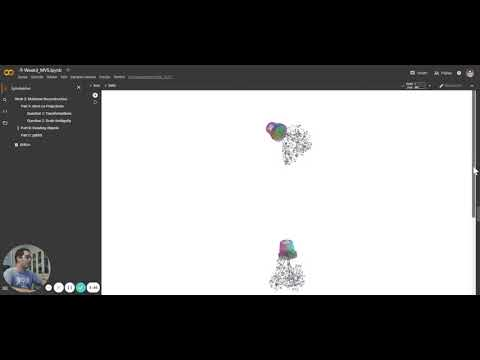

In [1]:
from IPython.display import YouTubeVideo
video = YouTubeVideo(id="_qGiu9UcPYo", width=854, height=480, fs=1)

video

In [ ]:
%%capture
!pip install open3d

In [ ]:
import plotly.graph_objects as go
##### taken from 
# https://github.com/intel-isl/Open3D/issues/1026
# https://colab.research.google.com/drive/1CR_HDvJ2AnjJV3Bf5vwP70K0hx3RcdMb
# I have contacted TA Sadra Safadoust and Dr. Fatma Guney regarding this
# beloow code was the only way I could run the visualization in Colab
def draw_geometries(geometries):
    graph_objects = []

    for geometry in geometries:
        geometry_type = geometry.get_geometry_type()
        
        if geometry_type == o3d.geometry.Geometry.Type.PointCloud:
            points = np.asarray(geometry.points)
            colors = None
            if geometry.has_colors():
                colors = np.asarray(geometry.colors)
            elif geometry.has_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.normals) * 0.5
            else:
                geometry.paint_uniform_color((1.0, 0.0, 0.0))
                colors = np.asarray(geometry.colors)

            scatter_3d = go.Scatter3d(x=points[:,0], y=points[:,1], z=points[:,2], mode='markers', marker=dict(size=1, color=colors))
            graph_objects.append(scatter_3d)

        if geometry_type == o3d.geometry.Geometry.Type.TriangleMesh:
            triangles = np.asarray(geometry.triangles)
            vertices = np.asarray(geometry.vertices)
            colors = None
            if geometry.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                colors = (1.0, 0.0, 0.0)
            
            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)
        
    fig = go.Figure(
        data=graph_objects,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False)
            )
        )
    )
    fig.show()

In [ ]:
import open3d as o3d
import numpy as np

def deg2rad(angleInDegrees):
    angleInRadians = (np.pi/180) * angleInDegrees
    return angleInRadians

def rotation(V, alpha_degree, beta_degree, gamma_degree, order):

    # Compute mean of vertices for vertex list V 
    center = np.mean(V, axis=0)
    
    #Create a translation matrix T as a 4x4 matrix that translates the model to the point (0,0,0) 
    T = np.zeros((4, 4))
    T[-1, -1] = 1
    
    #Create a translation matrix T_back as a 4x4 matrix that translates back to the center of V
    T_back = T
    T_back[:3, -1] = center
    

    order_perm = np.array([0, 0, 0])
    for i, ch in enumerate(order):
      if ch == 'x':
        order_perm[i] = 0
      elif ch == 'y':
        order_perm[i] = 1 
      elif ch == 'z':
        order_perm[i] = 2

    angles = np.array([alpha_degree, beta_degree, gamma_degree])
    angles = angles[order_perm]
    # convert degrees to radians
    alpha, beta, gamma = angles[0]*np.pi/180, angles[1]*np.pi/180, angles[2]*np.pi/180
    
    # Rotation matrices in homegeneuous coordinate
    R_x = np.array([[1, 0, 0, 0],
                    [0, np.cos(alpha), -np.sin(alpha), 0],
                    [0, np.sin(alpha), np.cos(alpha), 0],
                    [0, 0, 0, 0]
                    ])
    R_y = np.array([[np.cos(beta), 0, np.sin(beta), 0],
                    [0, 1, 0, 0],
                    [-np.sin(beta), 0, np.cos(beta), 0],
                    [0, 0, 0, 0]
                    ])
    R_z = np.array([[np.cos(gamma), -np.sin(gamma), 0, 0],
                    [np.sin(gamma), np.cos(gamma), 0, 0],
                    [0, 0, 1, 0],
                    [0, 0, 0, 0]
                    ])
    
    # Calculate Overall transformation matrix G (using T, T_back, R_x, R_y, R_z, order)
    # order determines the order of applying the rotations. 
    # e.g. if order=='xyz' first rotate around the x axis, then around y axis and then around the z axis
    G = R_z @ R_y @ R_x + T_back
            
    # Homogeneous coordinates of V
    Vh = np.concatenate([V, np.ones((len(V), 1))], axis=1)
    
    # Apply the transformation to the vertices (using G and Vh)
    Wh = Vh @ G
    # Go back from homogenous  to 3D coordinates
    W = Wh[:, :-1]
    return W
         
# load the model
mesh = o3d.io.read_triangle_mesh("data/model.off")
V = np.asarray(mesh.vertices)
o3d.visualization.draw_geometries = draw_geometries 

In [ ]:
# display the model
mesh.compute_vertex_normals()
o3d.visualization.draw_geometries([mesh])

# rotate the model (first around the x axis)
W = rotation(V, 50, 0, 25, order='xyz')
rotated_mesh = o3d.geometry.TriangleMesh(vertices=o3d.utility.Vector3dVector(W), triangles=mesh.triangles)

# display the rotated model
rotated_mesh.compute_vertex_normals()
o3d.visualization.draw_geometries([rotated_mesh])

# rotate the model (first around the z axis)
W = rotation(V, 50, 0, 25, order='zyx')
rotated_mesh = o3d.geometry.TriangleMesh(vertices=o3d.utility.Vector3dVector(W), triangles=mesh.triangles)

# display the rotated model
rotated_mesh.compute_vertex_normals()
o3d.visualization.draw_geometries([rotated_mesh])

print('done!')

done!


In [ ]:
%%capture
!pip install pykitti

## Part C: pykitti

There is a nice repository which serves as a development kit for KITTI in python: [pykitti](https://github.com/utiasSTARS/pykitti)

Install it and repeat the steps below with the provided sequence to see what kind of properties of the dataset is available with pykitti. After that, you will compute stereo as you did last week, this time by using pykitti.


Length of the loaded dataset: 10

Gray stereo pair baseline [m]: 0.537150600500771

RGB stereo pair baseline [m]: 0.5327254400790535

Difference between Gray and RGB baselines: [m] 0.004425160421717478

Difference beteween the first and the second timestamp: 0:00:00.520035


Text(0.5, 0.92, 'Third Velodyne scan (subsampled)')

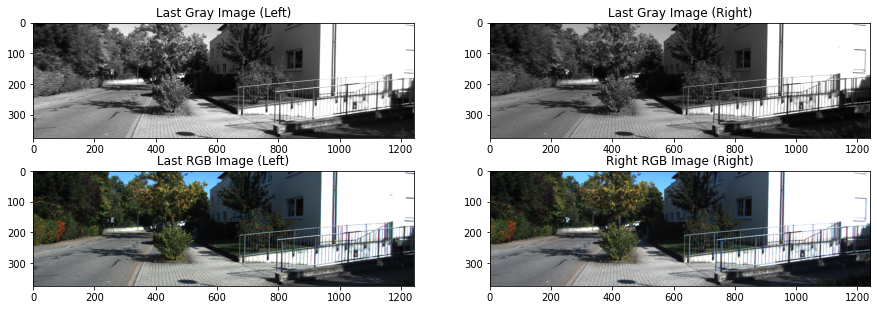

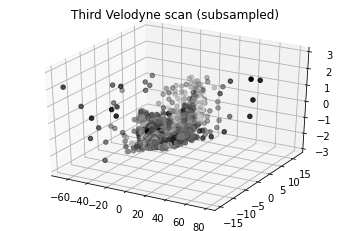

In [ ]:
import pykitti
import numpy as np
import matplotlib.pyplot as plt


basedir = 'data/KITTI-Raw'
date = '2011_09_26'
drive = '0079'

# The 'frames' argument is optional - default: None, which loads the whole dataset.
# Calibration, timestamps, and IMU data are read automatically. 
# Camera and velodyne data are available via properties that create generators
# when accessed, or through getter methods that provide random access.
dataset = pykitti.raw(basedir, date, drive, frames=range(0, 50, 5))

# dataset.calib:         Calibration data are accessible as a named tuple
# dataset.timestamps:    Timestamps are parsed into a list of datetime objects
# dataset.oxts:          List of OXTS packets and 6-dof poses as named tuples
# dataset.camN:          Returns a generator that loads individual images from camera N
# dataset.get_camN(idx): Returns the image from camera N at idx  
# dataset.gray:          Returns a generator that loads monochrome stereo pairs (cam0, cam1)
# dataset.get_gray(idx): Returns the monochrome stereo pair at idx  
# dataset.rgb:           Returns a generator that loads RGB stereo pairs (cam2, cam3)
# dataset.get_rgb(idx):  Returns the RGB stereo pair at idx  
# dataset.velo:          Returns a generator that loads velodyne scans as [x,y,z,reflectance]
# dataset.get_velo(idx): Returns the velodyne scan at idx  

# Get the following data:

#Length of the loaded dataset
len_dataset = len(dataset)

#Gray stereo pair baseline
gray_baseline = dataset.calib.b_gray

#RGB stereo pair baseline
rgb_baseline = dataset.calib.b_rgb

#Difference between the first and the second timestamp
diff_timestamp = dataset.timestamps[1] - dataset.timestamps[0]

#Last gray image (left camera)
last_gray_left = dataset.get_gray(-1)[0]

#Last gray image (right camera)
last_gray_right = dataset.get_gray(-1)[1]

#Last rgb image (left camera)
last_rgb_left = dataset.get_rgb(-1)[0]

#Last rgb image (right camera)
last_rgb_right = dataset.get_rgb(-1)[1]

#Third velodyne scan
third_velo = dataset.get_velo(2)

print('\nLength of the loaded dataset: ' + str(len_dataset))
print('\nGray stereo pair baseline [m]: ' + str(gray_baseline))
print('\nRGB stereo pair baseline [m]: ' + str(rgb_baseline))
print('\nDifference between Gray and RGB baselines: [m]', abs(rgb_baseline - gray_baseline))

print('\nDifference beteween the first and the second timestamp: ' + str(diff_timestamp))


f, ax = plt.subplots(2, 2, figsize=(15, 5))
ax[0, 0].imshow(last_gray_left, cmap='gray')
ax[0, 0].set_title('Last Gray Image (Left)')

ax[0, 1].imshow(last_gray_right, cmap='gray')
ax[0, 1].set_title('Last Gray Image (Right)')

ax[1, 0].imshow(last_rgb_left)
ax[1, 0].set_title('Last RGB Image (Left)')

ax[1, 1].imshow(last_rgb_right)
ax[1, 1].set_title('Right RGB Image (Right)')


f2 = plt.figure()
ax2 = f2.add_subplot(111, projection='3d')
# Plot every 100th point so things don't get too bogged down
velo_range = range(0, third_velo.shape[0], 100)
ax2.scatter(third_velo[velo_range, 0],
            third_velo[velo_range, 1],
            third_velo[velo_range, 2],
            c=third_velo[velo_range, 3],
            cmap='gray')
ax2.set_title('Third Velodyne scan (subsampled)')

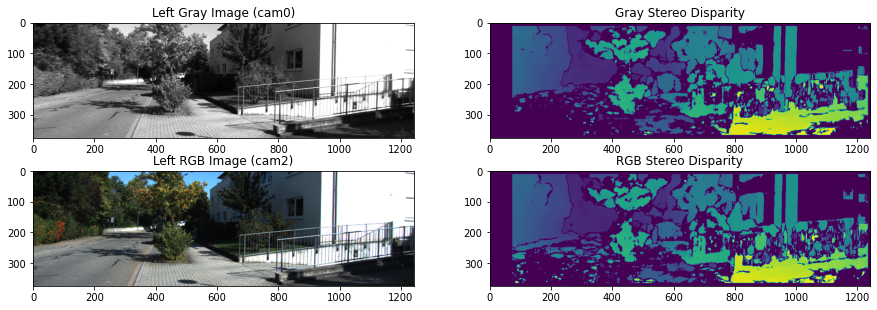

In [ ]:
# Do stereo processing 
import cv2

stereo = cv2.StereoBM_create()
# Use last_gray_left and last_gray_right and calculate the disparity
disp_gray = stereo.compute(np.array(last_gray_left), np.array(last_gray_right))
# Use last_rgb_left and last_rgb_right and calculate the disparity
disp_rgb = stereo.compute(
    cv2.cvtColor(np.array(last_rgb_left), cv2.COLOR_RGB2GRAY),
    cv2.cvtColor(np.array(last_rgb_right), cv2.COLOR_RGB2GRAY))

# Display some data
f, ax = plt.subplots(2, 2, figsize=(15, 5))
ax[0, 0].imshow(last_gray_left, cmap='gray')
ax[0, 0].set_title('Left Gray Image (cam0)')

ax[0, 1].imshow(disp_gray, cmap='viridis')
ax[0, 1].set_title('Gray Stereo Disparity')

ax[1, 0].imshow(last_rgb_left)
ax[1, 0].set_title('Left RGB Image (cam2)')

ax[1, 1].imshow(disp_rgb, cmap='viridis')
ax[1, 1].set_title('RGB Stereo Disparity')

plt.show()